In [1]:
#import library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import time
from datetime import timedelta
from sklearn.preprocessing import MinMaxScaler
import mplfinance as mpf
from sklearn.metrics import mean_squared_error
#from sklearn.linear_model import LinearRegression

In [2]:
# 2.Load Dataset
df = pd.read_csv("C:/Users/kakac/Datasets/FPT.csv")
#df = pd.read_csv("C:/Users/kakac/Datasets/PNJ.csv")
#df = pd.read_csv("C:/Users/kakac/Datasets/MSN.csv")
#df = pd.read_csv("C:/Users/kakac/Datasets/VIC.csv")
df

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,FPT,12/25/2018 9:15,30.89,30.89,30.89,30.89,35410,0
1,FPT,12/25/2018 9:16,30.81,30.81,30.81,30.81,190,0
2,FPT,12/25/2018 9:17,30.74,30.81,30.74,30.74,1120,0
3,FPT,12/25/2018 9:18,30.74,30.74,30.74,30.74,2120,0
4,FPT,12/25/2018 9:19,30.74,30.74,30.74,30.74,22500,0
...,...,...,...,...,...,...,...,...
97401,FPT,12/22/2020 14:24,58.20,58.20,58.20,58.20,27470,0
97402,FPT,12/22/2020 14:25,58.20,58.20,58.20,58.20,14820,0
97403,FPT,12/22/2020 14:26,58.20,58.20,58.20,58.20,500,0
97404,FPT,12/22/2020 14:29,58.10,58.10,58.10,58.10,2500,0


## Data preprocessing

In [3]:
for column in df.columns:
    print(column,df[column].nunique())

Ticker 1
Date/Time 97406
Open 802
High 800
Low 802
Close 802
Volume 6221
Open Interest 1


In [4]:
#kích thước dữ liệu
df.shape
df.info()
#Mô tả bộ dữ liệu
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97406 entries, 0 to 97405
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Ticker         97406 non-null  object 
 1   Date/Time      97406 non-null  object 
 2   Open           97406 non-null  float64
 3   High           97406 non-null  float64
 4   Low            97406 non-null  float64
 5   Close          97406 non-null  float64
 6   Volume         97406 non-null  int64  
 7   Open Interest  97406 non-null  int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 5.9+ MB


,Open,High,Low,Close,Volume,Open Interest
count,97406.000000,97406.000000,97406.000000,97406.000000,9.740600e+04,97406.0
mean,45.071630,45.090138,45.051430,45.071631,8.044173e+03,0.0
std,6.359803,6.364950,6.354245,6.359799,1.753203e+04,0.0
min,30.250000,30.250000,30.220000,30.250000,1.000000e+01,0.0
25%,39.740000,39.740000,39.700000,39.740000,7.500000e+02,0.0
50%,46.950000,46.950000,46.950000,46.950000,2.960000e+03,0.0
75%,49.200000,49.250000,49.170000,49.200000,8.960000e+03,0.0
max,58.400000,58.500000,58.400000,58.400000,1.255930e+06,0.0


In [5]:
df.shape
df.info()
#Mô tả bộ dữ liệu
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97406 entries, 0 to 97405
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Ticker         97406 non-null  object 
 1   Date/Time      97406 non-null  object 
 2   Open           97406 non-null  float64
 3   High           97406 non-null  float64
 4   Low            97406 non-null  float64
 5   Close          97406 non-null  float64
 6   Volume         97406 non-null  int64  
 7   Open Interest  97406 non-null  int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 5.9+ MB


,Open,High,Low,Close,Volume,Open Interest
count,97406.000000,97406.000000,97406.000000,97406.000000,9.740600e+04,97406.0
mean,45.071630,45.090138,45.051430,45.071631,8.044173e+03,0.0
std,6.359803,6.364950,6.354245,6.359799,1.753203e+04,0.0
min,30.250000,30.250000,30.220000,30.250000,1.000000e+01,0.0
25%,39.740000,39.740000,39.700000,39.740000,7.500000e+02,0.0
50%,46.950000,46.950000,46.950000,46.950000,2.960000e+03,0.0
75%,49.200000,49.250000,49.170000,49.200000,8.960000e+03,0.0
max,58.400000,58.500000,58.400000,58.400000,1.255930e+06,0.0


In [6]:
#find missing values
features_na = [features for features in df.columns if df[features].isnull().sum()>0]
for features in features_na:
    print(feature, np.round(df[feature].isnull().mean(),4),' % missing values')
else: 
    print("No missing values found")

No missing values found


In [7]:
df.isna().sum()

Ticker           0
Date/Time        0
Open             0
High             0
Low              0
Close            0
Volume           0
Open Interest    0
dtype: int64

In [8]:
colums_to_drop= ['Ticker','Open Interest']
df.drop(columns=colums_to_drop,inplace = True )
df.head()

,Date/Time,Open,High,Low,Close,Volume
0,12/25/2018 9:15,30.89,30.89,30.89,30.89,35410
1,12/25/2018 9:16,30.81,30.81,30.81,30.81,190
2,12/25/2018 9:17,30.74,30.81,30.74,30.74,1120
3,12/25/2018 9:18,30.74,30.74,30.74,30.74,2120
4,12/25/2018 9:19,30.74,30.74,30.74,30.74,22500


In [9]:
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

# Tách thành phần date, year, month, và time
#df['Date'] = df['Date/Time'].dt.date
df['Year'] = df['Date/Time'].dt.year
#df['Month'] = df['Date/Time'].dt.month
#df['Day'] = df['Date/Time'].dt.day
#df['Time'] = df['Date/Time'].dt.time
#df.drop(columns='Date/Time', inplace = True)
df.head()

,Date/Time,Open,High,Low,Close,Volume,Year
0,2018-12-25 09:15:00,30.89,30.89,30.89,30.89,35410,2018
1,2018-12-25 09:16:00,30.81,30.81,30.81,30.81,190,2018
2,2018-12-25 09:17:00,30.74,30.81,30.74,30.74,1120,2018
3,2018-12-25 09:18:00,30.74,30.74,30.74,30.74,2120,2018
4,2018-12-25 09:19:00,30.74,30.74,30.74,30.74,22500,2018


## Exploratory Data Analysis

<Axes: xlabel='Open'>

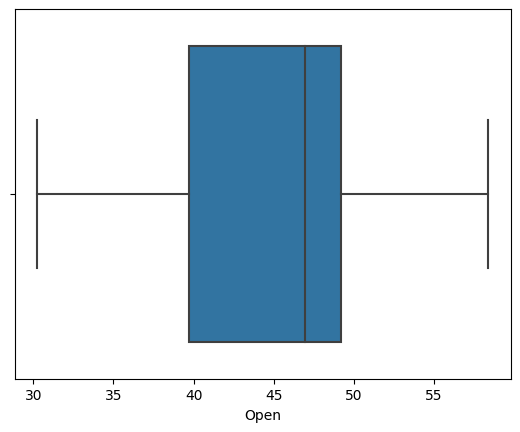

In [10]:
sns.boxplot(x=df["Open"])


<Axes: xlabel='Close'>

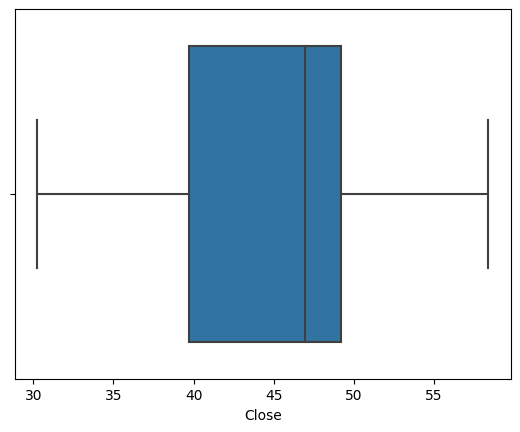

In [11]:
sns.boxplot(x=df["Close"])


<Axes: xlabel='Volume'>

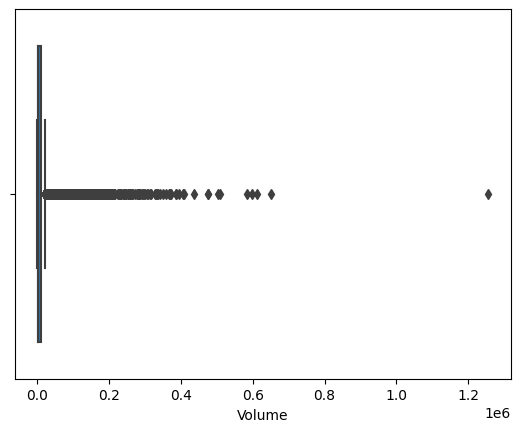

In [12]:
sns.boxplot(x=df["Volume"])

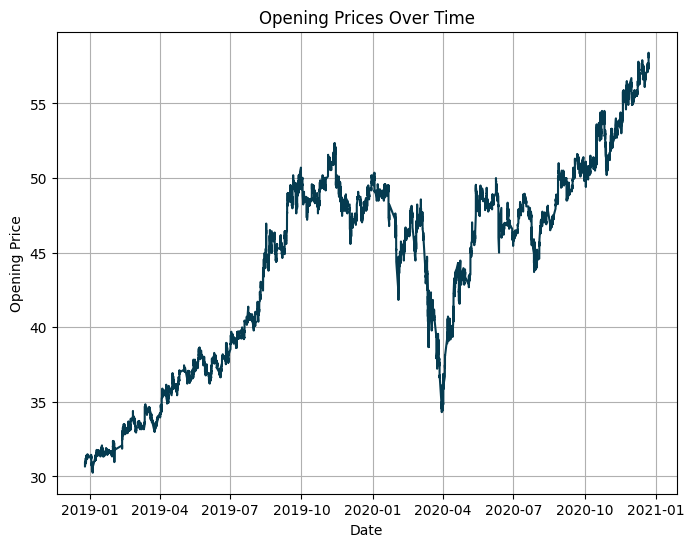

In [13]:
# Create a line chart

# Set the figure size for the plot
plt.figure(figsize=(8, 6))

# Plot the 'Close' prices over time
plt.plot(df['Date/Time'], df['Open'], label='Open', color='#053B50')

# Set the plot title
plt.title('Opening Prices Over Time')

# Label the x-axis as 'Date'
plt.xlabel('Date')

# Label the y-axis as 'Closing Price'
plt.ylabel('Opening Price')
plt.grid(True)


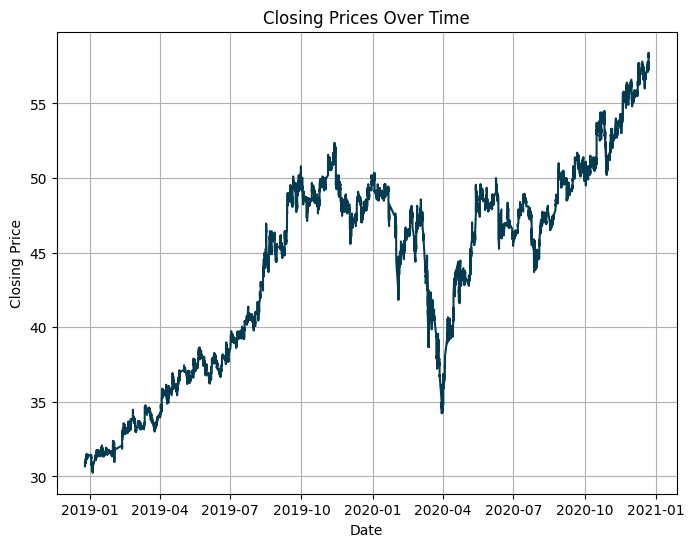

In [14]:
# Create a line chart

# Set the figure size for the plot
plt.figure(figsize=(8, 6))

# Plot the 'Close' prices over time
plt.plot(df['Date/Time'], df['Close'], label='Close', color='#053B50')

# Set the plot title
plt.title('Closing Prices Over Time')

# Label the x-axis as 'Date'
plt.xlabel('Date')

# Label the y-axis as 'Closing Price'
plt.ylabel('Closing Price')
plt.grid(True)

In [15]:
fig = go.Figure(data=go.Scatter(x=df['Date/Time'], y=df['Close']))
fig.update_layout(title='Closing Prices Over Time', xaxis_title='Date', yaxis_title='Close Prices')
fig.show()

Text(0, 0.5, 'Volume')

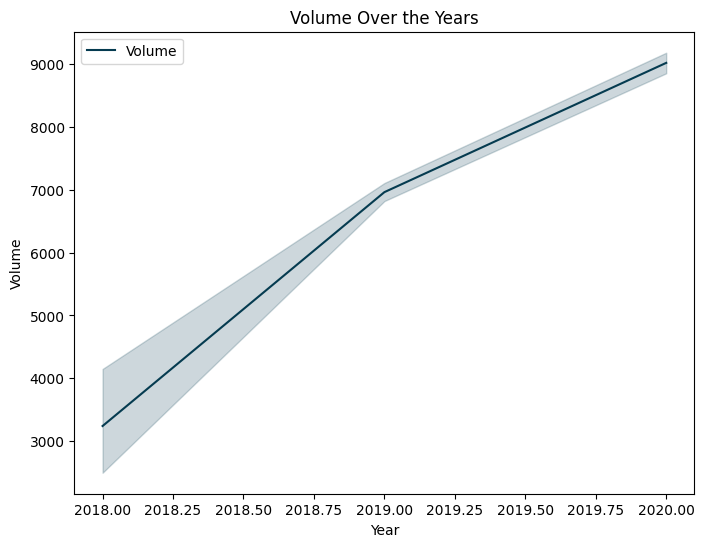

In [16]:
# Create the line plot using Seaborn
plt.figure(figsize=(8, 6)) # Set the figure size
# Create a line plot using Seaborn to visualize how the 'Volume' has changed over the years
sns.lineplot(data=df, x='Year', y='Volume', color='#053B50', label='Volume')

plt.title('Volume Over the Years')  # Set the title of the plot
plt.xlabel('Year') # Label for the x-axis
plt.ylabel('Volume') # Label for the y-axis

## Outlier detection using IQR

In [17]:
def out_iqr(df , column):
    global lower,upper
    q25, q75 = np.quantile(df[column], 0.25), np.quantile(df[column], 0.75)
    # calculate the IQR
    iqr = q75 - q25
    # calculate the outlier cutoff
    cut_off = iqr * 1.5
    # calculate the lower and upper bound value
    lower, upper = q25 - cut_off, q75 + cut_off
    print('')
    print('The IQR is',iqr)
    print('The lower bound value is', lower)
    print('The upper bound value is', upper)
    # Calculate the number of records below and above lower and above bound value respectively
    df1 = df[df[column] > upper]
    df2 = df[df[column] < lower]
    return print('Total number of outliers are', df1.shape[0]+ df2.shape[0])

In [18]:
out_iqr(df,'Open')
out_iqr(df,'Close')


The IQR is 9.46
The lower bound value is 25.55
The upper bound value is 63.39
Total number of outliers are 0

The IQR is 9.46
The lower bound value is 25.55
The upper bound value is 63.39
Total number of outliers are 0


## Filter dữ liệu và tính cột biến động

Filter dữ liệu vào lúc 9:15p hằng ngày

In [19]:
df_filtered= df[(df['Date/Time'].dt.hour == 9) & (df['Date/Time'].dt.minute == 15)]
df_filtered

,Date/Time,Open,High,Low,Close,Volume,Year
0,2018-12-25 09:15:00,30.89,30.89,30.89,30.89,35410,2018
7,2018-12-26 09:15:00,31.04,31.11,31.04,31.11,2650,2018
133,2018-12-27 09:15:00,31.41,31.52,31.41,31.49,13610,2018
267,2018-12-28 09:15:00,31.34,31.34,31.34,31.34,13490,2018
389,2019-01-02 09:15:00,31.19,31.34,31.19,31.34,86430,2019
...,...,...,...,...,...,...,...
96352,2020-12-16 09:15:00,57.20,57.20,57.20,57.20,32710,2020
96565,2020-12-17 09:15:00,56.90,56.90,56.80,56.80,96300,2020
96763,2020-12-18 09:15:00,56.50,56.80,56.50,56.80,55320,2020
96976,2020-12-21 09:15:00,57.30,57.40,57.30,57.40,38080,2020


## Tính biến động: Biến động giá cổ phiếu = Giá cổ phiếu N (phút hoặc giờ hoặc ngày) sau - Giá cổ phiếu hiện tại.

In [20]:
# Sử dụng .diff() để tính biến động
df_filtered['BienDong'] = df_filtered['Close'].diff()

# Fill na cột đầu = 0 
df_filtered.loc[:,'BienDong'] = df_filtered['BienDong'].fillna(0)

# Hiển thị DataFrame sau khi tính biến động giá
df_filtered

C:\Users\kakac\AppData\Local\Temp\ipykernel_7264\3233584497.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kakac\AppData\Local\Temp\ipykernel_7264\3233584497.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date/Time,Open,High,Low,Close,Volume,Year,BienDong
0,2018-12-25 09:15:00,30.89,30.89,30.89,30.89,35410,2018,0.00
7,2018-12-26 09:15:00,31.04,31.11,31.04,31.11,2650,2018,0.22
133,2018-12-27 09:15:00,31.41,31.52,31.41,31.49,13610,2018,0.38
267,2018-12-28 09:15:00,31.34,31.34,31.34,31.34,13490,2018,-0.15
389,2019-01-02 09:15:00,31.19,31.34,31.19,31.34,86430,2019,0.00
...,...,...,...,...,...,...,...,...
96352,2020-12-16 09:15:00,57.20,57.20,57.20,57.20,32710,2020,-0.30
96565,2020-12-17 09:15:00,56.90,56.90,56.80,56.80,96300,2020,-0.40
96763,2020-12-18 09:15:00,56.50,56.80,56.50,56.80,55320,2020,0.00
96976,2020-12-21 09:15:00,57.30,57.40,57.30,57.40,38080,2020,0.60


In [21]:
#Định dạng lại cột Date từ obj -> datatime
df_filtered['Date/Time'] = pd.to_datetime(df_filtered['Date/Time'])
df_filtered.set_index('Date/Time', inplace = True)
df_filtered

C:\Users\kakac\AppData\Local\Temp\ipykernel_7264\713156006.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Open,High,Low,Close,Volume,Year,BienDong
Date/Time,,,,,,,
2018-12-25 09:15:00,30.89,30.89,30.89,30.89,35410,2018,0.00
2018-12-26 09:15:00,31.04,31.11,31.04,31.11,2650,2018,0.22
2018-12-27 09:15:00,31.41,31.52,31.41,31.49,13610,2018,0.38
2018-12-28 09:15:00,31.34,31.34,31.34,31.34,13490,2018,-0.15
2019-01-02 09:15:00,31.19,31.34,31.19,31.34,86430,2019,0.00
...,...,...,...,...,...,...,...
2020-12-16 09:15:00,57.20,57.20,57.20,57.20,32710,2020,-0.30
2020-12-17 09:15:00,56.90,56.90,56.80,56.80,96300,2020,-0.40
2020-12-18 09:15:00,56.50,56.80,56.50,56.80,55320,2020,0.00


In [22]:
df_filtered = df_filtered.loc[:, ['BienDong']]
df_filtered

,BienDong
Date/Time,
2018-12-25 09:15:00,0.00
2018-12-26 09:15:00,0.22
2018-12-27 09:15:00,0.38
2018-12-28 09:15:00,-0.15
2019-01-02 09:15:00,0.00
...,...
2020-12-16 09:15:00,-0.30
2020-12-17 09:15:00,-0.40
2020-12-18 09:15:00,0.00


<Axes: xlabel='Date/Time'>

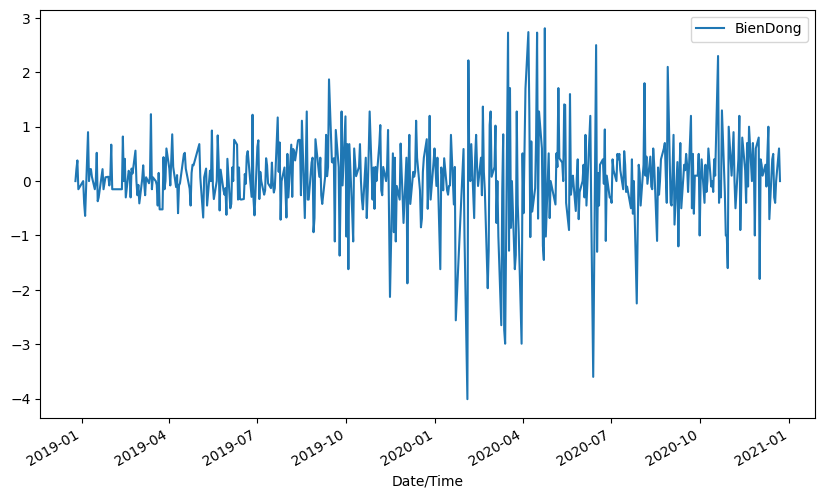

In [23]:
df_filtered.plot(figsize=(10,6))

# SARIMAX MODEL

In [24]:
# Kiểm tra tính dừng
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(df_filtered.BienDong, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -25.457217848473558
2. P-Value :  0.0
3. Num Of Lags :  0
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 495
5. Critical Values :
	 1% :  -3.4436298692815304
	 5% :  -2.867396599893435
	 10% :  -2.5698893429241916


=> dãy có tính dừng

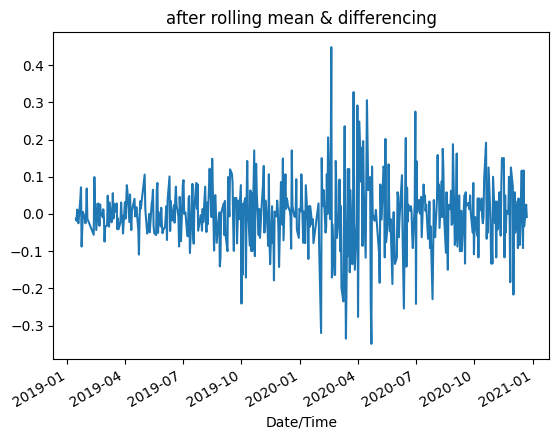

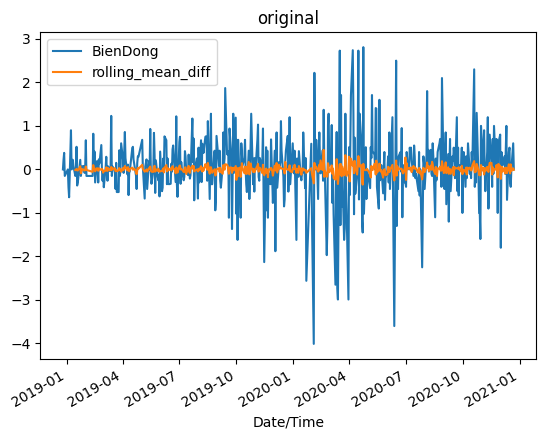

In [25]:
# Tính giá trị trung bình trượt
rolling_mean = df_filtered.rolling(window = 12).mean()
df_filtered['rolling_mean_diff'] = rolling_mean - rolling_mean.shift()
ax1 = plt.subplot()
df_filtered['rolling_mean_diff'].plot(title='after rolling mean & differencing');
ax2 = plt.subplot()
df_filtered.plot(title='original');

In [26]:
# Kiểm tra tính dừng
dftest = adfuller(df_filtered['rolling_mean_diff'].dropna(), autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
  print("\t",key, ": ", val)

1. ADF :  -9.482850874937595
2. P-Value :  3.8314384341611778e-16
3. Num Of Lags :  12
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 471
5. Critical Values :
	 1% :  -3.444310291143469
	 5% :  -2.867695986993458
	 10% :  -2.5700489042602586


In [27]:
# Chia tập dữ liệu thành train, test, validate (75-15-10)
# Tính số lượng mẫu tương ứng với từng tập
train_size = int(len(df_filtered) * 0.75)
test_size = int(len(df_filtered) * 0.15)
validate_size = len(df_filtered) - train_size - test_size

# Chia dữ liệu thành các tập
train_data = df_filtered[:train_size]


test_data = df_filtered[train_size:train_size+test_size]
validate_data = df_filtered[train_size+test_size:]

# Kiểm tra kích thước của từng tập
print("Train data size:", len(train_data))
print("Test data size:", len(test_data))
print("Validate data size:", len(validate_data))

Train data size: 372
Test data size: 74
Validate data size: 50


In [28]:
import statsmodels.api as sm
# Xác định các giá trị tốt nhất cho các tham số khởi tạo
from statsmodels.tsa.statespace.sarimax import SARIMAX
#train_data.index.freq = 'D'
#train_data.freq = 'D'  # Đặt tần số hàng ngày
model = SARIMAX(train_data['BienDong'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))  # 12 là tần số hàng năm

model_fit = model.fit()

# In thông tin về mô hình
model_fit.summary()

C:\Users\kakac\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\kakac\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                           BienDong   No. Observations:                  372
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -461.906
Date:                            Wed, 15 Nov 2023   AIC                            933.812
Time:                                    16:06:59   BIC                            953.229
Sample:                                         0   HQIC                           941.534
                                            - 372                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1252      0.038     -3.293      0.001      -0.200      -0.051
ma.L1         -0.9997      0.337     -2.968      0.003      -1.660      -0.340
ar.S.L12       0.0745      0.054      1.383      0.167      -0.031       0.180
ma.S.L12      -0.9999     28.321     -0.035      0.972     -56.508      54.508
sigma2         0.6682     18.949      0.035      0.972     -36.471      37.807
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               312.31
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               9.21   Skew:                            -0.65
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.38
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Đánh giá mô hình SARIMAX

In [29]:
# Qá trình Testing
x_test = np.array(test_data.index)
y_test = np.array(test_data['BienDong'])

y_pred = model_fit.predict(start=0, end=len(y_test)-1)

# Tính toán MAPE cho quá trình test
mape_test = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_test - y_pred))
# In kết quả
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape_test )

MAE: 0.5155662142938103
MSE: 0.4775587110468234
RMSE: 0.6910562285710357
MAPE: inf


In [30]:
#Quá trình Validate
x_validate = np.array(validate_data.index)
y_validate = np.array(validate_data['BienDong'])

y_pred_val = model_fit.predict(start=0, end=len(y_validate)-1)

# Tính toán MAPE cho quá trình validate
mape_validate = np.mean(np.abs((y_validate - y_pred_val) / y_validate)) * 100

mse = mean_squared_error(y_validate, y_pred_val)
rmse = np.sqrt(mse)
mae = np.mean(np.abs(y_validate - y_pred_val))
# In kết quả
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:",mape_validate)

MAE: 0.5836028458216318
MSE: 0.6390339456238376
RMSE: 0.7993959879958353
MAPE: inf


In [31]:
#Tính RMSE
valid_rmse = np.sqrt(np.mean((y_pred_val - y_validate)**2))
test_rmse = np.sqrt(np.mean((y_pred - y_test)**2))
print('Testing RMSE:', test_rmse)
print('Validation RMSE:', valid_rmse)

# Tính toán MAPE 
mape_test = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
mape_validate = np.mean(np.abs((y_validate - y_pred_val) / y_validate)) * 100
print("Testing MAPE:", mape_test )
print("Validation MAPE:",mape_validate)

#Tính toán MAE
mae_test = np.mean(np.abs(y_test - y_pred))
mae_val = np.mean(np.abs(y_validate - y_pred_val))

print("Testing MAE:", mae_test)
print("Validation MAE:", mae_val)

Testing RMSE: 0.6910562285710357
Validation RMSE: 0.7993959879958353
Testing MAPE: inf
Validation MAPE: inf
Testing MAE: 0.5155662142938103
Validation MAE: 0.5836028458216318


In [32]:
# Lấy ngày cuối cùng trong dữ liệu
last_date = df_filtered.index[-1]

# Tạo danh sách các ngày trong 30 ngày tiếp theo
forecast_dates = pd.date_range(start=last_date + pd.DateOffset(days=1), periods=30)

# Dự đoán 30 ngày tiếp theo từ ngày cuối cùng
forecast = model_fit.get_forecast(steps=30, index=forecast_dates)

# Lấy các giá trị dự đoán
forecast_values = forecast.predicted_mean


forecast_dates

DatetimeIndex(['2020-12-23 09:15:00', '2020-12-24 09:15:00',
               '2020-12-25 09:15:00', '2020-12-26 09:15:00',
               '2020-12-27 09:15:00', '2020-12-28 09:15:00',
               '2020-12-29 09:15:00', '2020-12-30 09:15:00',
               '2020-12-31 09:15:00', '2021-01-01 09:15:00',
               '2021-01-02 09:15:00', '2021-01-03 09:15:00',
               '2021-01-04 09:15:00', '2021-01-05 09:15:00',
               '2021-01-06 09:15:00', '2021-01-07 09:15:00',
               '2021-01-08 09:15:00', '2021-01-09 09:15:00',
               '2021-01-10 09:15:00', '2021-01-11 09:15:00',
               '2021-01-12 09:15:00', '2021-01-13 09:15:00',
               '2021-01-14 09:15:00', '2021-01-15 09:15:00',
               '2021-01-16 09:15:00', '2021-01-17 09:15:00',
               '2021-01-18 09:15:00', '2021-01-19 09:15:00',
               '2021-01-20 09:15:00', '2021-01-21 09:15:00'],
              dtype='datetime64[ns]', freq='D')

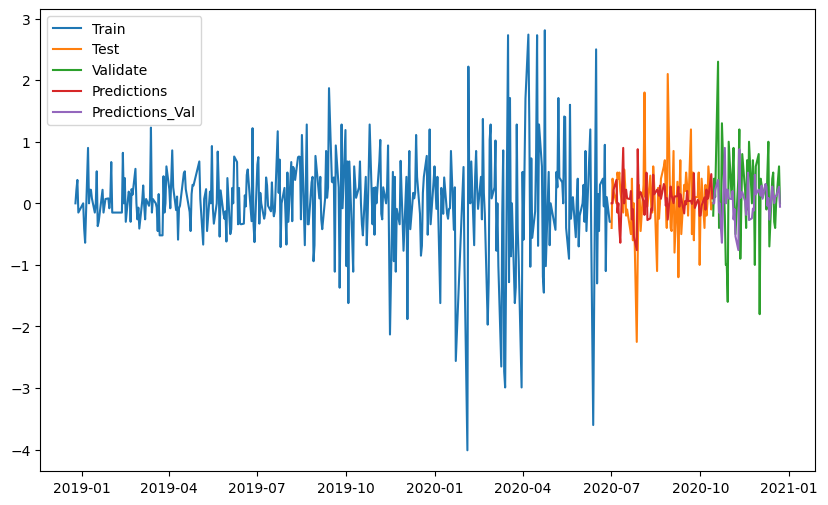

In [33]:
# Vẽ biểu đồ 
plt.figure(figsize=(10, 6))
plt.plot(train_data.index, train_data['BienDong'])
plt.plot(test_data.index, test_data['BienDong'])
plt.plot(validate_data.index, validate_data['BienDong'])
plt.plot(test_data.index, y_pred)
plt.plot(validate_data.index, y_pred_val)
plt.legend(['Train', 'Test','Validate','Predictions','Predictions_Val'])
plt.show()

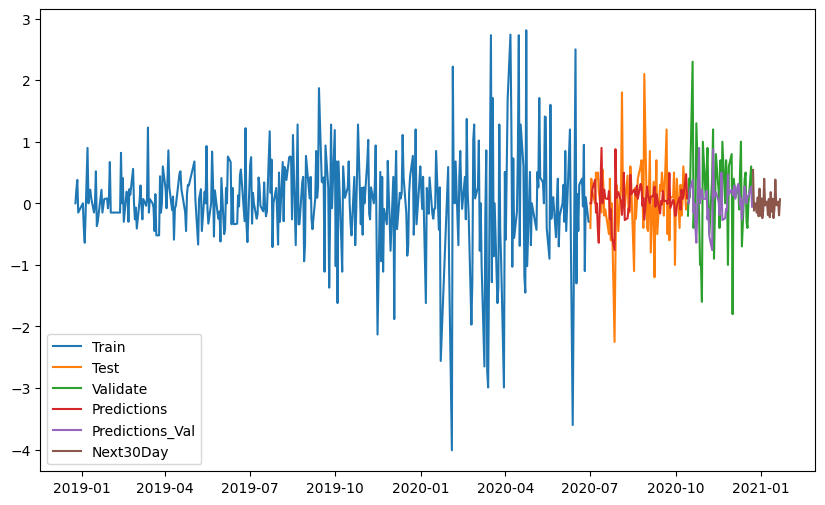

In [34]:
# Vẽ biểu đồ
plt.figure(figsize=(10, 6))
plt.plot(train_data.index, train_data['BienDong'])
plt.plot(test_data.index, test_data['BienDong'])
plt.plot(validate_data.index, validate_data['BienDong'])
plt.plot(test_data.index, y_pred)
plt.plot(validate_data.index, y_pred_val)
plt.plot(forecast_dates, forecast_values)  
plt.legend(['Train', 'Test','Validate','Predictions','Predictions_Val','Next30Day'])
plt.show()

In [35]:
"""
plt.figure(figsize=(10, 6))
plt.plot(forecast_dates, forecast_values)  
plt.legend(['Bien dong Next30Day'])
plt.show()
"""


fig = go.Figure(data=go.Scatter(x=forecast_dates, y=forecast_values))
fig.update_layout(title='Bien dong next 30 day', xaxis_title='Date', yaxis_title='Close Prices')
fig.show()

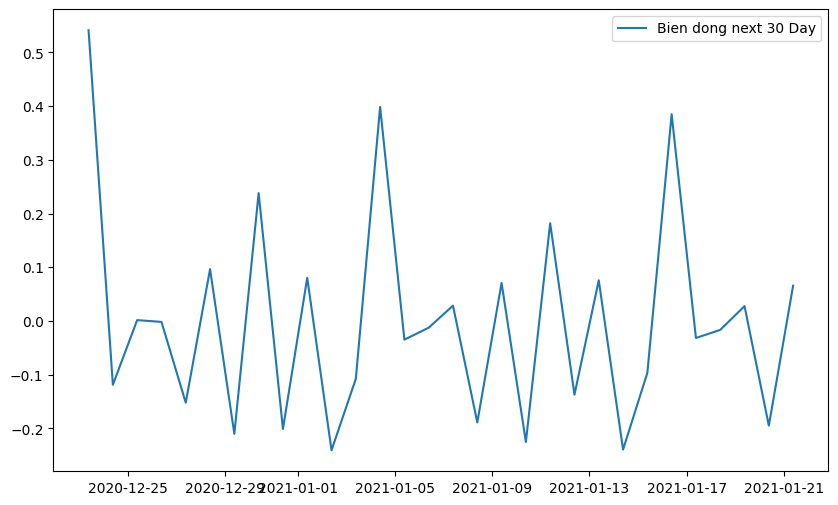

In [36]:
plt.figure(figsize=(10, 6))
plt.plot(forecast_dates, forecast_values)  
plt.legend(['Bien dong next 30 Day'])
plt.show()

## GRU MODEL

In [37]:
# 2. Đọc file csv và gắng index với giá Price
df1=df_filtered.reset_index()['BienDong']
df1

0      0.00
1      0.22
2      0.38
3     -0.15
4      0.00
       ... 
491   -0.30
492   -0.40
493    0.00
494    0.60
495    0.00
Name: BienDong, Length: 496, dtype: float64

In [38]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, GRU

In [39]:
df1

0      0.00
1      0.22
2      0.38
3     -0.15
4      0.00
       ... 
491   -0.30
492   -0.40
493    0.00
494    0.60
495    0.00
Name: BienDong, Length: 496, dtype: float64

In [40]:
# 3. Scaler data
scaler=MinMaxScaler(feature_range=(0,1))
df1=scaler.fit_transform(np.array(df1).reshape(-1,1))
#df_filtered[np.isnan(df_filtered)] = 0
df1


array([[0.58797654],
       [0.6202346 ],
       [0.64369501],
       [0.5659824 ],
       [0.58797654],
       [0.52785924],
       [0.4941349 ],
       [0.71994135],
       [0.58797654],
       [0.6202346 ],
       [0.6202346 ],
       [0.59970674],
       [0.5659824 ],
       [0.58797654],
       [0.66422287],
       [0.53372434],
       [0.54398827],
       [0.59970674],
       [0.6202346 ],
       [0.5659824 ],
       [0.59824047],
       [0.59970674],
       [0.57624633],
       [0.59970674],
       [0.68621701],
       [0.5659824 ],
       [0.5659824 ],
       [0.70821114],
       [0.58797654],
       [0.64809384],
       [0.54398827],
       [0.61583578],
       [0.60997067],
       [0.54398827],
       [0.62170088],
       [0.6085044 ],
       [0.67008798],
       [0.58797654],
       [0.54985337],
       [0.57771261],
       [0.52785924],
       [0.59384164],
       [0.63049853],
       [0.58357771],
       [0.54985337],
       [0.59824047],
       [0.58211144],
       [0.599

In [41]:
# 4. Chia train test
train_size = int(0.65 * len(df1))
test_size = int(0.25 * len(df1))
val_size = len(df1) - train_size - test_size

train_data = df1[:train_size]
test_data = df1[train_size:train_size+test_size]
val_data = df1[train_size+test_size:]

In [42]:
# 5. Hàm Create Dataset
import numpy
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-time_step-1):
		a = dataset[i:(i+time_step), 0]   ###i=0, X=0,1,2,3-----99   Y=100 
		dataX.append(a)
		dataY.append(dataset[i + time_step, 0])
	return numpy.array(dataX), numpy.array(dataY)


In [43]:
#6. Reshape into X=t,t+1,t+2..t+99 and Y=t+100
time_step = 40
X_train, y_train = create_dataset(train_data, time_step)
X_val, yval = create_dataset(val_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)

In [44]:
yval

array([0.66129032, 0.73460411, 0.48533724, 0.64662757, 0.66129032,
       0.54398827, 0.52932551, 0.58797654, 0.67595308])

In [45]:
# 7. Reshape input to be [samples, time steps, features] which is required for LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_val

array([[[0.55865103],
        [0.64662757],
        [0.6026393 ],
        [0.92521994],
        [0.52932551],
        [0.58797654],
        [0.54398827],
        [0.77859238],
        [0.55865103],
        [0.44134897],
        [0.44134897],
        [0.35337243],
        [0.73460411],
        [0.6026393 ],
        [0.66129032],
        [0.71994135],
        [0.58797654],
        [0.51466276],
        [0.64662757],
        [0.76392962],
        [0.45601173],
        [0.57331378],
        [0.70527859],
        [0.61730205],
        [0.52932551],
        [0.69061584],
        [0.57331378],
        [0.73460411],
        [0.58797654],
        [0.69061584],
        [0.63196481],
        [0.44134897],
        [0.67595308],
        [0.70527859],
        [0.32404692],
        [0.64662757],
        [0.63196481],
        [0.6026393 ],
        [0.63196481],
        [0.57331378]],

       [[0.64662757],
        [0.6026393 ],
        [0.92521994],
        [0.52932551],
        [0.58797654],
        

In [46]:
# 8. Define GRU Model
model = Sequential()
model.add(GRU(64, input_shape=(time_step, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

In [47]:
# 9. Fit mô hình với dữ liệu train
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=64,verbose=1)

Epoch 1/100
5/5 [==============================] - 3s 151ms/step - loss: 0.1731 - val_loss: 0.0742
Epoch 2/100
5/5 [==============================] - 0s 23ms/step - loss: 0.0492 - val_loss: 0.0100
Epoch 3/100
5/5 [==============================] - 0s 20ms/step - loss: 0.0195 - val_loss: 0.0239
Epoch 4/100
5/5 [==============================] - 0s 16ms/step - loss: 0.0317 - val_loss: 0.0166
Epoch 5/100
5/5 [==============================] - 0s 22ms/step - loss: 0.0206 - val_loss: 0.0089
Epoch 6/100
5/5 [==============================] - 0s 22ms/step - loss: 0.0167 - val_loss: 0.0113
Epoch 7/100
5/5 [==============================] - 0s 20ms/step - loss: 0.0189 - val_loss: 0.0121
Epoch 8/100
5/5 [==============================] - 0s 17ms/step - loss: 0.0184 - val_loss: 0.0098
Epoch 9/100
5/5 [==============================] - 0s 21ms/step - loss: 0.0164 - val_loss: 0.0089
Epoch 10/100
5/5 [==============================] - 0s 22ms/step - loss: 0.0162 - val_loss: 0.0091
Epoch 11/100
5/5 [

In [48]:
# 10. Dự báo dữ liệu test, val
train_predict=model.predict(X_train)
y_pred=model.predict(X_test)
y_pred_val=model.predict(X_val)

1/1 [==============================] - 0s 17ms/step


In [49]:
# 11. Chuẩn hóa dữ liệu y_pred, y_pred_val
train_predict=scaler.inverse_transform(train_predict)
y_pred=scaler.inverse_transform(y_pred)
y_pred_val=scaler.inverse_transform(y_pred_val)

In [50]:
ytest = scaler.inverse_transform(ytest.reshape(-1,1))
yval = scaler.inverse_transform(yval.reshape(-1,1))

In [51]:
# 12. Đánh giá độ chính xác thuật toán bằng RMSE
valid_rmse = np.sqrt(np.mean((y_pred_val - yval)**2))
test_rmse = np.sqrt(np.mean((y_pred - ytest)**2))
print('Validation RMSE:', valid_rmse)
print('Testing RMSE:', test_rmse)

Validation RMSE: 0.5499977710867073
Testing RMSE: 0.625022748776879


In [52]:
# Đánh giá độ chính xác thuật toán bằng MAE
valid_mae = np.mean(abs(y_pred_val - yval))
test_mae = np.mean(abs(y_pred - ytest))
print('Validation MAE:', valid_mae)
print('Testing MAE:', test_mae)

Validation MAE: 0.4889683110109117
Testing MAE: 0.46423331608866786


In [53]:
# Đánh giá độ chính xác thuật toán bằng MAPE
valid_mape = np.mean(np.abs(y_pred_val - yval)/np.abs(y_pred_val))
test_mape = np.mean(np.abs(y_pred - ytest)/np.abs(y_pred))

print('Validation MAPE:', valid_mape)
print('Testing MAPE:', test_mape)

Validation MAPE: 152.8744870404889
Testing MAPE: 40.4124532246399


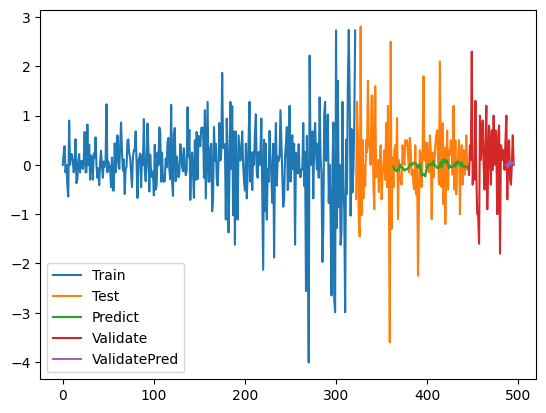

In [54]:
# 14.Vẽ hình
train_data_index = pd.RangeIndex(start=0, stop=train_size, step=1)
plt.plot(scaler.inverse_transform(train_data))
test_data_index = pd.RangeIndex(start=train_size, stop=train_size+test_size, step=1)
plt.plot(test_data_index,scaler.inverse_transform(test_data))
test_data_index = pd.RangeIndex(start=train_size+41, stop=train_size+test_size, step=1)
plt.plot(test_data_index,(y_pred))
val_data_index = pd.RangeIndex(start=train_size+test_size, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,scaler.inverse_transform(val_data))
val_data_index = pd.RangeIndex(start=train_size+test_size+41, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,y_pred_val)
plt.legend(['Train','Test','Predict','Validate','ValidatePred'])
plt.show()

In [55]:
val_data.shape

(50, 1)

In [56]:
# 13. Dự báo 30 ngày tiếp theo

# Lấy các giá trị dự đoán
forecast_values = forecast.predicted_mean


forecast_dates
x_input=val_data[40:].reshape(1,-1)
x_input.shape

temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=30
i=0
while(i<30):
    
    if(len(temp_input)>10):
        #print(temp_input)
        x_input=np.array(temp_input[1:])
        print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        #print(x_input)
        yhat = model.predict(x_input, verbose=0)
        print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
        lst_output.extend(yhat.tolist())
        i=i+1
    else:
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        print(yhat[0])
        temp_input.extend(yhat[0].tolist())
        print(len(temp_input))
        lst_output.extend(yhat.tolist())
        i=i+1

ValueError: cannot reshape array of size 10 into shape (1,30,1)

In [ ]:
# 14.Vẽ hình
train_data_index = pd.RangeIndex(start=0, stop=train_size, step=1)
plt.plot(scaler.inverse_transform(train_data))
test_data_index = pd.RangeIndex(start=train_size, stop=train_size+test_size, step=1)
plt.plot(test_data_index,scaler.inverse_transform(test_data))
test_data_index = pd.RangeIndex(start=train_size+41, stop=train_size+test_size, step=1)
plt.plot(test_data_index,(y_pred))
val_data_index = pd.RangeIndex(start=train_size+test_size, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,scaler.inverse_transform(val_data))
val_data_index = pd.RangeIndex(start=train_size+test_size+41, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,y_pred_val)
predict_data_index = pd.RangeIndex(start=len(df1)-1, stop=len(df1)+29, step=1)
plt.plot(predict_data_index,scaler.inverse_transform(lst_output))
plt.legend(['Train','Test','Predict','Validate','ValidatePred','Predict30days'])
plt.show()

In [ ]:
# 14.Vẽ hình
# Dự đoán 30 ngày tiếp theo
prediect_data_index = pd.RangeIndex(start=len(df1)-1, stop=len(df1)+29, step=1)
plt.plot(prediect_data_index,scaler.inverse_transform(lst_output))
plt.legend(['Predict30days'])
plt.show()

In [ ]:
print(scaler.inverse_transform(lst_output))

## LSTM MODEL

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from keras.layers import Dense, LSTM

In [ ]:
# Reshape into X=t,t+1,t+2..t+99 and Y=t+100
time_step = 35
X_train1, y_train1 = create_dataset(train_data, time_step)
X_val1, y_val1 = create_dataset(val_data, time_step)
X_test1, y_test1 = create_dataset(test_data, time_step)

In [ ]:
# 7. Reshape input to be [samples, time steps, features] which is required for LSTM
X_train1 =X_train1.reshape(X_train1.shape[0],X_train1.shape[1] , 1)
X_test1 = X_test1.reshape(X_test1.shape[0],X_test1.shape[1] , 1)
X_val1 = X_val1.reshape(X_val1.shape[0],X_val1.shape[1] , 1)

In [ ]:
# 8. Define LSTM Model
model_2=Sequential()
model_2.add(LSTM(50,return_sequences=True,input_shape=(35,1)))
model_2.add(LSTM(50,return_sequences=True))
model_2.add(LSTM(50))
model_2.add(Dense(1))
model_2.compile(loss='mean_squared_error',optimizer='adam')

In [ ]:
# Fit mô hình với dữ liệu train
model_2.fit(X_train1,y_train1,validation_data=(X_test1,y_test1),epochs=100,batch_size=35,verbose=1)

In [ ]:
# Dự báo dữ liệu test, val
train_predict1 = model_2.predict(X_train1)
y_pred1 = model_2.predict(X_test1)
y_pred_val1 = model_2.predict(X_val1)

In [ ]:
# 11. Chuẩn hóa dữ liệu y_pred, y_pred_val
train_predict1 = scaler.inverse_transform(train_predict1)
y_pred1=scaler.inverse_transform(y_pred1)
y_pred_val1=scaler.inverse_transform(y_pred_val1)

In [ ]:
y_test1 = scaler.inverse_transform(y_test1.reshape(-1,1))
y_val1 = scaler.inverse_transform(y_val1.reshape(-1,1))

In [ ]:
# Đánh giá độ chính xác thuật toán bằng RMSE
valid_rmse1 = np.sqrt(np.mean((y_pred_val1 - y_val1)**2))
test_rmse1 = np.sqrt(np.mean((y_pred1 - y_test1)**2))

print('Validation RMSE:', valid_rmse1)
print('Testing RMSE:', test_rmse1)

In [ ]:
# Đánh giá độ chính xác thuật toán bằng MAPE
valid_mape1 = np.mean(np.abs(y_pred_val1 - y_val1)/np.abs(y_pred_val1))
test_mape1 = np.mean(np.abs(y_pred1 - y_test1)/np.abs(y_pred1))

print('Validation MAPE:', valid_mape1)
print('Testing MAPE:', test_mape1)

In [ ]:
from sklearn.metrics import mean_absolute_error
# mae = mean_absolute_error(actual_prices, predicted_prices)
valid_mae1 = mean_absolute_error(y_val1, y_pred_val1)
test_mae1 = mean_absolute_error(y_test1, y_pred1)
print('Validation MAE:', valid_mae1)
print('Testing MAE:', test_mae1)

# Đánh giá độ chính xác thuật toán bằng MAE
valid_mae2 = np.mean(abs(y_pred_val1 - y_val1))
test_mae2 = np.mean(abs(y_pred1 - y_test1))
print('Validation MAE:', valid_mae2)
print('Testing MAE:', test_mae2)

In [ ]:
# Đánh giá độ chính xác thuật toán bằng MAPE
valid_mape1 = np.mean(np.abs(y_pred_val1 - y_val1)/np.abs(y_pred_val1))
test_mape1 = np.mean(np.abs(y_pred1 - y_test1)/np.abs(y_pred1))

print('Validation MAPE:', valid_mape1)
print('Testing MAPE:', test_mape1)

In [ ]:
# Vẽ hình
train_data_index = pd.RangeIndex(start=0, stop=train_size, step=1)
plt.plot(scaler.inverse_transform(train_data))
test_data_index = pd.RangeIndex(start=train_size, stop=train_size+test_size, step=1)
plt.plot(test_data_index,scaler.inverse_transform(test_data))
test_data_index = pd.RangeIndex(start=train_size+36, stop=train_size+test_size, step=1)
plt.plot(test_data_index,(y_pred1))
val_data_index = pd.RangeIndex(start=train_size+test_size, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,scaler.inverse_transform(val_data))
val_data_index = pd.RangeIndex(start=train_size+test_size+36, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,y_pred_val1)

plt.legend(['Train','Test','Predict','Validate','ValidatePred'])
plt.show()

In [ ]:
# Dự báo 30 ngày tiếp theo
x_input=val_data[36:].reshape(1,-1)
x_input.shape

temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output1=[]
n_steps=34
i=0
while(i<30):
    
    if(len(temp_input)>34):
        #print(temp_input)
        x_input=np.array(temp_input[1:])
        print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        #print(x_input)
        yhat = model_2.predict(x_input, verbose=0)
        print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
        lst_output1.extend(yhat.tolist())
        i=i+1
    else:
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model_2.predict(x_input, verbose=0)
        print(yhat[0])
        temp_input.extend(yhat[0].tolist())
        print(len(temp_input))
        lst_output1.extend(yhat.tolist())
        i=i+1

In [ ]:
# 14.Vẽ hình
train_data_index = pd.RangeIndex(start=0, stop=train_size, step=1)
plt.plot(scaler.inverse_transform(train_data))
test_data_index = pd.RangeIndex(start=train_size, stop=train_size+test_size, step=1)
plt.plot(test_data_index,scaler.inverse_transform(test_data))
test_data_index = pd.RangeIndex(start=train_size+36, stop=train_size+test_size, step=1)
plt.plot(test_data_index,(y_pred1))
val_data_index = pd.RangeIndex(start=train_size+test_size, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,scaler.inverse_transform(val_data))
val_data_index = pd.RangeIndex(start=train_size+test_size+36, stop=train_size+test_size+val_size, step=1)
plt.plot(val_data_index,y_pred_val1)
predict_data_index1 = pd.RangeIndex(start=len(df1)-1, stop=len(df1)+29, step=1)
plt.plot(predict_data_index1,scaler.inverse_transform(lst_output1))
plt.legend(['Train','Test','Predict','Validate','ValidatePred','Predict30days'])
plt.show()

In [ ]:
# 14.Vẽ hình
# Dự đoán 30 ngày tiếp theo
predict_data_index1 = pd.RangeIndex(start=len(df1)-1, stop=len(df1)+29, step=1)
plt.plot(predict_data_index1,scaler.inverse_transform(lst_output1))
plt.legend(['Predict30days'])
plt.show()

In [ ]:
scaler.inverse_transform(lst_output1)